In [ ]:
import matplotlib.pyplot as plt
import torch
import torchvision
import os

from torch import nn
from torchvision import transforms

In [ ]:
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

[INFO] Couldn't find torchinfo... installing it.


## Import extra functions

In [14]:
try:
  from extras import engine, model_builder, utils, predictions
except:
  !git clone https://github.com/mrkrisgee/FoodVision.git
  !mv FoodVision/extras .
  !rm -rf FoodVision
  from extras import engine, model_builder, utils, predictions

Cloning into 'FoodVision'...
remote: Enumerating objects: 29, done.
remote: Counting objects: 100% (29/29), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 29 (delta 7), reused 20 (delta 3), pack-reused 0
Receiving objects: 100% (29/29), 23.17 KiB | 23.17 MiB/s, done.
Resolving deltas: 100% (7/7), done.


In [ ]:
device = utils.set_device()
print(f"Device being used: {device}")

Device being used: cuda


### Download Food101 Dataset

In [ ]:
# Get Food101 Dataset
import torchvision
from torchvision import transforms

# Create a transform to normalize data distribution to be inline with ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], # values per colour channel [red, green, blue]
                                 std=[0.229, 0.224, 0.225])

# Create a transform pipeline
simple_transform = transforms.Compose([
                                       transforms.Resize((224, 224)),
                                       transforms.ToTensor(), # get image values between 0 & 1
                                       normalize
])

# Download and transform Food101 data (note: this may take ~5 minutes in Google Colab)
train_data = torchvision.datasets.Food101(root="data",
                                          split="train",
                                          transform=simple_transform,
                                          download=True)

test_data = torchvision.datasets.Food101(root="data",
                                        split="test",
                                        transform=simple_transform,
                                        download=True)

100%|██████████| 4996278331/4996278331 [04:40<00:00, 17800129.44it/s]


Extracting data/food-101.tar.gz to data


### Create Food101 DataLoaders

In [ ]:
# Create DataLoaders
import os
BATCH_SIZE = 512 # use a big batch size to get through all the images (100,000+ in Food101)

train_dataloader = torch.utils.data.DataLoader(train_data,
                                                   shuffle=True,
                                                   batch_size=BATCH_SIZE,
                                                   num_workers=os.cpu_count(),
                                                   pin_memory=True) # avoid copies of the data into and out of memory, where possible (for speed ups)

test_dataloader = torch.utils.data.DataLoader(test_data,
                                                  shuffle=False,
                                                  batch_size=BATCH_SIZE,
                                                  num_workers=os.cpu_count(),
                                                  pin_memory=True)

In [ ]:
# Get class names
class_names = train_data.classes
# Get number of output channels (one for each class)
OUT_FEATURES = len(class_names)

## Init experiment parameters

In [ ]:
# 1.  A list of the number of epochs we'd like to test
num_epochs = [15]

# 2. Create models list (new model needed for each experiment) - A list of the models we'd like to test
models = ["effnetb2"]

# 3. Create dataloaders dictionary- A dictionary of the different training DataLoaders (if any)
train_dataloaders ={"data": train_dataloader}

## Init experiment iterations and train our model

In [ ]:
%%time
# 1. Set random seeds
utils.set_seeds()

# 2. Keep track of experiment numbers
experiment_number = 0

# 3. Loop through each DataLoader
for dataloader_name, train_dataloader in train_dataloaders.items():

    # 4. Loop through each number of epochs
    for epochs in num_epochs:

        # 5. Loop through each model name and create a new model based on the name
        for model_name in models:

            # 6. Information print out
            experiment_number += 1
            print(f"[INFO] Experiment number: {experiment_number}")
            print(f"[INFO] Model: {model_name}")
            print(f"[INFO] DataLoader: {dataloader_name}")
            print(f"[INFO] Number of epochs: {epochs}")

            # 7. Select the model
            if model_name == "tinyvgg":
                model = model_builder.TinyVGG(hidden_units=10, output_shape=OUT_FEATURES).to(device)
                model.name = "TinyVGG"
                print(f"\n[INFO] Created new {model.name} model.")
            elif model_name == "effnetb0":
                model = model_builder.create_effnetb0(OUT_FEATURES)
            elif model_name == "effnetb2":
                model = model_builder.create_effnetb2(OUT_FEATURES)
            elif model_name == "effnetv2_s":
                model = model_builder.create_effnetv2_s(OUT_FEATURES)
            elif model_name == "resnet101":
                model = model_builder.create_resnet101(OUT_FEATURES)

            # 8. Define loss function and optimizer
            loss_fn = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

            # 9. Create a writer
            writer = utils.create_writer(experiment_name=dataloader_name,
                                        model_name=model_name,
                                        extra=f"{epochs}_epochs")

            # 10. Train target model and track experiments
            engine.train(model=model,
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=epochs,
                        device=device,
                        writer=writer)

            # 11. Save the model to file
            save_filepath = f"FoodVision_{model_name}_{dataloader_name}_{epochs}_epochs.pth"
            utils.save_model(model=model,
                            target_dir="models",
                            model_name=save_filepath)
            print("-"*50 + "\n")

            # 12. Clean up unnecessary_files
            utils.delete_unnecessary_files()

[INFO] Experiment number: 1
[INFO] Model: effnetb2
[INFO] DataLoader: data
[INFO] Number of epochs: 15


Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:03<00:00, 9.65MB/s]



[INFO] Creating effnet_b2 feature extractor model...
[INFO] Created SummaryWriter, saving to: runs/2024-05-24/data/effnetb2/15_epochs...


  0%|          | 0/15 [00:00<?, ?it/s]

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch: 1 | train_loss: 3.4035 | train_acc: 0.3205 | test_loss: 2.4729 | test_acc: 0.4915
Epoch: 2 | train_loss: 2.4717 | train_acc: 0.4478 | test_loss: 2.0640 | test_acc: 0.5274
Epoch: 3 | train_loss: 2.2367 | train_acc: 0.4781 | test_loss: 1.9184 | test_acc: 0.5475
Epoch: 4 | train_loss: 2.1236 | train_acc: 0.4933 | test_loss: 1.8410 | test_acc: 0.5574
Epoch: 5 | train_loss: 2.0573 | train_acc: 0.5046 | test_loss: 1.7932 | test_acc: 0.5634
Epoch: 6 | train_loss: 2.0085 | train_acc: 0.5112 | test_loss: 1.7577 | test_acc: 0.5676
Epoch: 7 | train_loss: 1.9722 | train_acc: 0.5180 | test_loss: 1.7374 | test_acc: 0.5721
Epoch: 8 | train_loss: 1.9449 | train_acc: 0.5234 | test_loss: 1.7219 | test_acc: 0.5732
Epoch: 9 | train_loss: 1.9120 | train_acc: 0.5296 | test_loss: 1.7087 | test_acc: 0.5758
Epoch: 10 | train_loss: 1.9019 | train_acc: 0.5294 | test_loss: 1.6880 | test_acc: 0.5799
Epoch: 11 | train_loss: 1.8898 | train_acc: 0.5315 | test_loss: 1.6873 | test_acc: 0.5775
Epoch: 12 | train_l

### Inspect model results

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## Select 3 random images from our Food101 Data Set, then predict and plot them.

In [42]:
# Store model path
model_path = "models/FoodVision_effnetb2_data_15_epochs.pth"

# Instantiate new model
new_model = model_builder.create_effnetb2(OUT_FEATURES=OUT_FEATURES)

# Load state dict from instantiated model in model path
new_model.load_state_dict(torch.load(model_path))


[INFO] Creating effnet_b2 feature extractor model...


<All keys matched successfully>

In [47]:
from pathlib import Path
import random

# The number of images to plot
num_images_to_plot = 3

# Root path
images_root = Path("data/food-101/images")

# Init list
all_image_paths = []

# Iterate through food class folders
for class_folder in images_root.iterdir():
    if class_folder.is_dir():
        # Create lists of all image paths for each class name
        image_paths = list(class_folder.glob("*.jpg"))
        all_image_paths.extend(image_paths)

# Randomly sample from all_image_paths list
random_images = random.sample(all_image_paths, k=min(num_images_to_plot, len(all_image_paths)))

print(random_images)

[PosixPath('data/food-101/images/cheese_plate/1474541.jpg'), PosixPath('data/food-101/images/edamame/3166085.jpg'), PosixPath('data/food-101/images/chicken_quesadilla/2367805.jpg')]


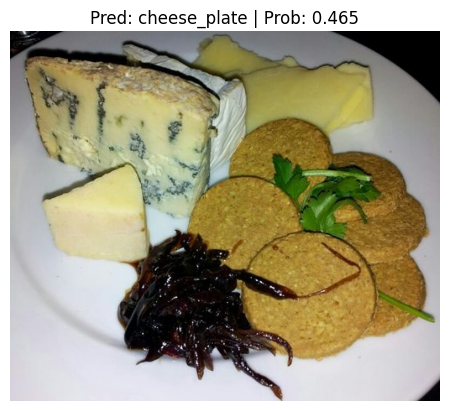

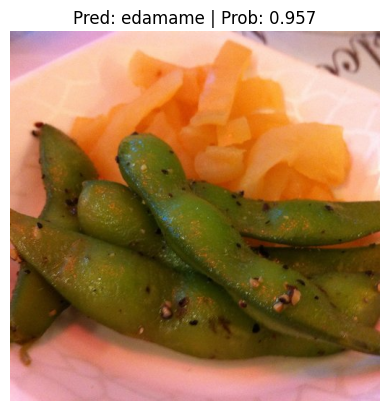

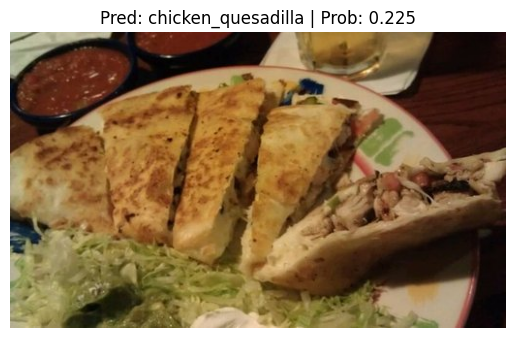

In [48]:
# Predict and plot our random images
for random_image in random_images:
  predictions.pred_and_plot_image(model=new_model,
                            image_path=random_image,
                            class_names=class_names,
                            image_size=(224, 224))

## Predict and plot a custom images found online

In [94]:
# Root path
custom_images_root = Path("/content/image_samples")

if custom_images_root.exists():
  print(f"Custom images directory exists. Skipping Download...")
else:
  !git clone https://github.com/mrkrisgee/FoodVision.git
  !mv FoodVision/image_samples .
  !rm -rf FoodVision
  print(f"\nDownloaded custom images directory...")

Cloning into 'FoodVision'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 36 (delta 8), reused 26 (delta 3), pack-reused 0
Receiving objects: 100% (36/36), 2.32 MiB | 1.38 MiB/s, done.
Resolving deltas: 100% (8/8), done.

Downloaded custom images directory...


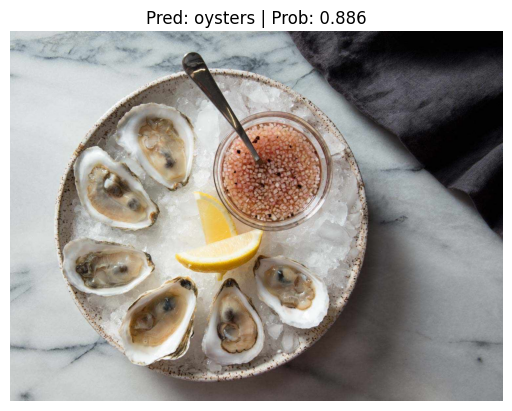

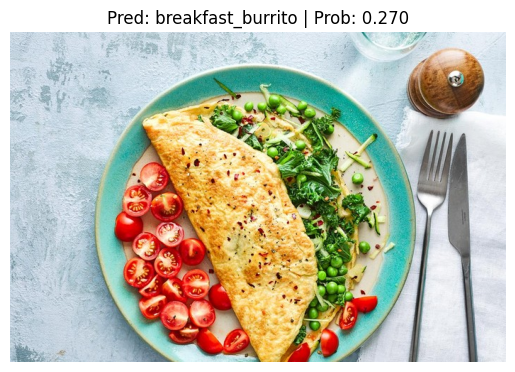

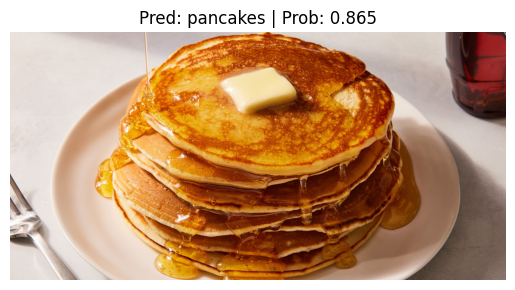

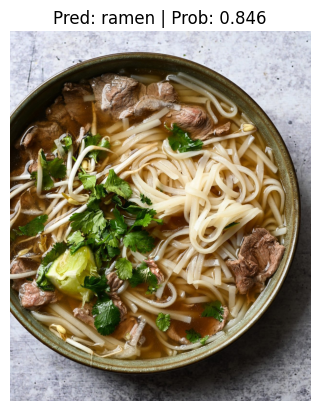

In [95]:
# Root path
custom_images_root = Path("/content/image_samples")

# Init list
custom_image_paths = []

# Store paths of JPG files in a list
jpg_paths = list(custom_images_root.glob("*.jpg"))
custom_image_paths.extend(jpg_paths)

# Extend list with PNG files
png_paths = list(custom_images_root.glob("*.png"))
custom_image_paths.extend(png_paths)

# custom_images_to_plot = len(custom_image_paths)

# Predict and plot our random images
for custom_image in custom_image_paths:
  predictions.pred_and_plot_image(model=new_model,
                            image_path=custom_image,
                            class_names=class_names,
                            image_size=(224, 224))

## Plot Confusion matrix to see where our model got confused between predictions and true labels

In [99]:
try:
  import torchmetrics, mlxtend
  print(f"Importing torchmetrics and mlxtend")
except:
  print(f"Installing torchmetrics and mlxtend")
  !pip install -q torchmetrics -U mlxtend
  import torchmetrics, mlxtend

Installing torchmetrics and mlxtend
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 49.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 64.1 MB/s eta 0:00:00


In [101]:
## Make predictions on entire dataset and send predictions to cpu

# Import tqdm for progress bar
from tqdm.auto import tqdm

y_preds = []
new_model.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader):
    # Send data to target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = new_model(X)
    # Get predictions as logits and convert to prediction labels
    y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 32, so can perform on dim=1)
    # Put predictions on CPU for evaluation
    y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor = torch.cat(y_preds)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  0%|          | 0/50 [00:00<?, ?it/s]

In [105]:
# Get the truth labels for test dataset
target = torch.cat([y for X, y in test_dataloader])
target

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


tensor([23, 23, 23,  ..., 69, 69, 69])

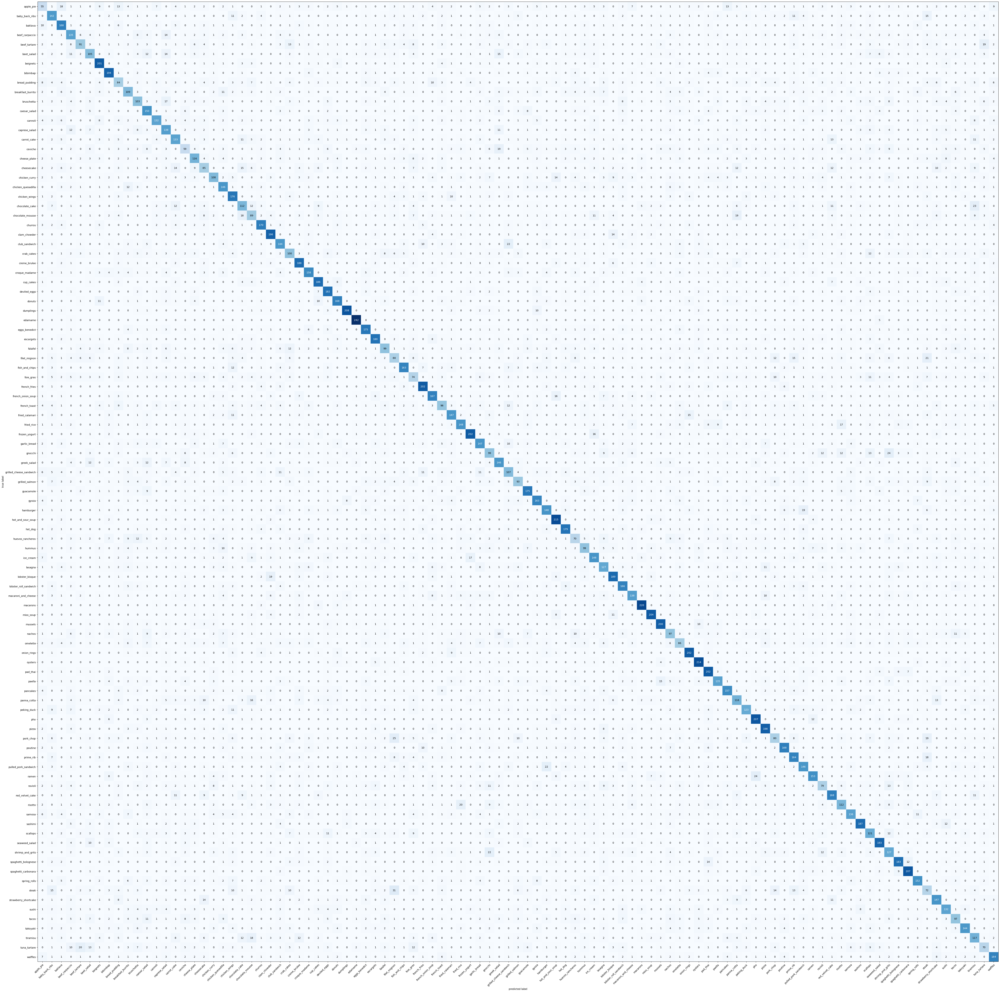

In [107]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# 2. Setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor,
                         target=target)

# 3. Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(), # matplotlib likes working with NumPy
    class_names=class_names, # turn the row and column labels into class names
    figsize=(100, 70)
);

In [ ]:
+++